##### Tiago Lyrio

RA: 046799

In [1]:
import os

import numpy as np
from numpy.fft import fft2, ifft2, fftshift, ifftshift

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d
from seaborn import color_palette

import skimage
from skimage.filters import window
from skimage import util

In [2]:
from mo443_lib import draw_square
from mo443_lib import read_imgs
from mo443_lib import show_hist
from mo443_lib import compare_imgs
from mo443_lib import plot_fft_histogram

## Importando o banco de imagens

### Imagens em tons de cinza.

In [3]:
img_path = 'https://www.ic.unicamp.br/~helio/imagens_pgm/'
#img_path = 'imagens_pgm/'

images,img_names = read_imgs(loc='url',img_path=img_path)

total de imagens: 7
imagens: ['baboon.pgm', 'fiducial.pgm', 'monarch.pgm', 'peppers.pgm', 'retina.pgm', 'sonnet.pgm', 'wedge.pgm']

Detalhes:
baboon.pgm: 	max = 248 	min = 0 	shape = (512, 512) 	type = uint8
fiducial.pgm: 	max = 255 	min = 2 	shape = (480, 640) 	type = uint8
monarch.pgm: 	max = 244 	min = 17 	shape = (512, 768) 	type = uint8
peppers.pgm: 	max = 255 	min = 0 	shape = (594, 623) 	type = uint8
retina.pgm: 	max = 255 	min = 0 	shape = (256, 256) 	type = uint8
sonnet.pgm: 	max = 251 	min = 27 	shape = (510, 384) 	type = uint8
wedge.pgm: 	max = 246 	min = 53 	shape = (384, 507) 	type = uint8


### Imagens coloridas

In [4]:
img_path = 'https://www.ic.unicamp.br/~helio/imagens_coloridas/'
color_images,color_img_names = read_imgs(loc='url',img_path=img_path)

total de imagens: 4
imagens: ['baboon.png', 'monalisa.png', 'peppers.png', 'watch.png']

Detalhes:
baboon.png: 	max = 255 	min = 0 	shape = (512, 512, 3) 	type = uint8
monalisa.png: 	max = 255 	min = 0 	shape = (256, 256, 3) 	type = uint8
peppers.png: 	max = 237 	min = 0 	shape = (512, 512, 3) 	type = uint8
watch.png: 	max = 255 	min = 0 	shape = (768, 1024, 3) 	type = uint8


##### Atribuindo constantes aos nomes de cada imagem para facilitar o código:

In [5]:
baboon   = 0
fiducial = 1
monarch  = 2
peppers  = 3
retina   = 4
sonnet   = 5
wedge    = 6

### Histograma das imagens

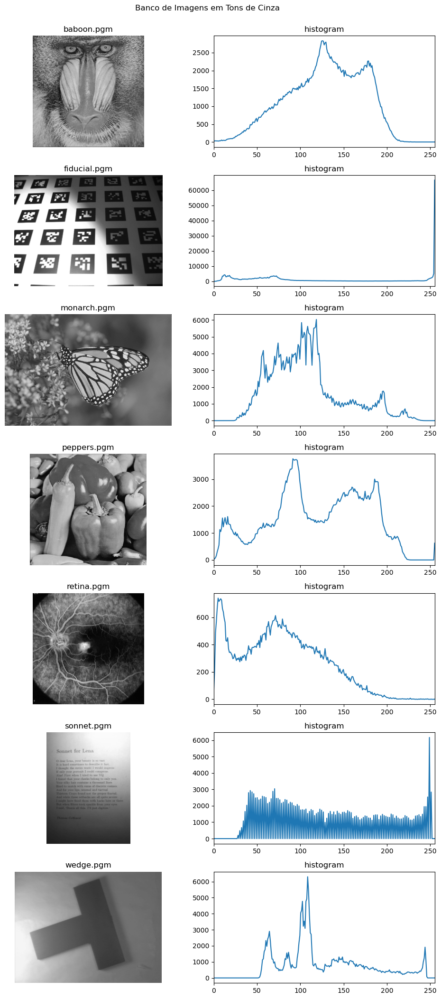

In [6]:
title = 'Banco de Imagens em Tons de Cinza'
show_hist(images,img_names, title = title);

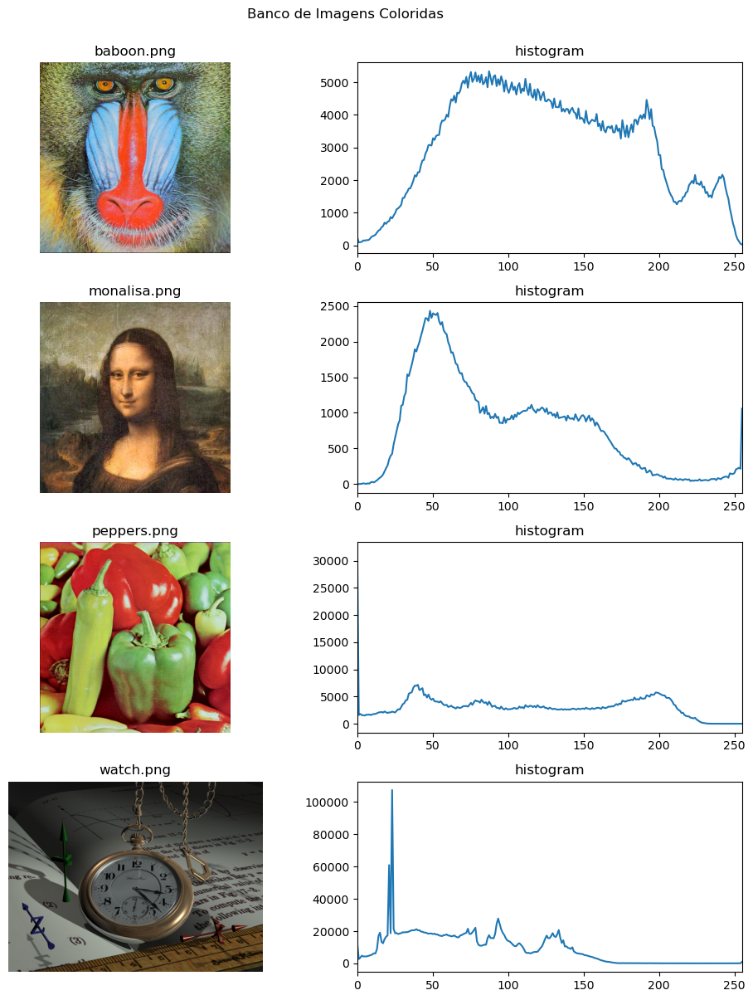

In [7]:
title = 'Banco de Imagens Coloridas'
show_hist(color_images,color_img_names, title = title);

---

# Meio-Tom

As técnicas de meios-tons visam reduzir a quantidade de cores (quantização de cores) utilizadas para exibir uma imagem, procurando manter uma boa percepção visual por parte do usuário.

Para isso, primeiramente vamos definir se o pixel em questão ($f[x,y]$) se aproxima mais do valor máximo (branco) ou do mínimo (preto) e atribuir o pixel da imagem resultante($g[x,y]$) como zero ou um, a depender do caso. Após essa atribuição, calculamos o erro gerado:  
$erro = f[x,y] - g[x,y] * 255$

Após calcular o erro gerado, vamos distribuí-lo em pixels próximos de acordo com diferentes estratégias. Abaixo podemos ver algumas delas.

## Estratégias de distribuição do erro

In [8]:
floyd     = 0
stevenson = 1
burkes    = 2
sierra    = 3
stucki    = 4
jarvis    = 5

method_names  = ['Floyd','Stevenson','Burkes','Sierra','Stucki','Jarvis']
path_strategy = ['Left to Right', 'Zig Zag']

#matriz com as diferentes estratégias de distribuição de erro
error_distribution = []

#Floyd e Steinberg
E = [[   0,    0, 7/16],
     [3/16, 5/16, 1/16]]

error_distribution.append(np.array(E))

#Stevenson e Arce
E = [[     0,      0,      0,      0,      0, 32/200,      0],
     [12/200,      0, 26/200,      0, 30/200,      0, 16/200],
     [     0, 12/200,      0, 26/200,      0, 12/200,      0],
     [ 5/200,      0, 12/200,      0, 12/200,      0,  5/200]]

error_distribution.append(np.array(E))

#Burkes
E = [[0   ,    0,    0, 8/32, 4/32],
     [2/32, 4/32, 8/32, 4/32, 2/32]]

error_distribution.append(np.array(E))

#Sierra
E = [[   0,    0,    0, 5/32, 3/32],
     [2/32, 4/32, 5/32, 4/32, 2/32],
     [   0, 2/32, 3/32, 2/32,    0]]

error_distribution.append(np.array(E))

#Stucki
E = [[   0,    0,    0, 8/42, 4/42],
     [2/42, 4/42, 8/42, 4/42, 2/42],
     [1/42, 2/42, 4/42, 2/42, 1/42]]

error_distribution.append(np.array(E))

#Jarvis, Judice e Ninke
E = [[   0,    0,    0, 7/48, 5/48],
     [3/48, 5/48, 7/48, 5/48, 3/48],
     [1/48, 3/48, 5/48, 3/48, 1/48]]

error_distribution.append(np.array(E))

Conferindo se os valores foram digitados corretamente.  
(a soma tem que dar 1)

In [9]:
for name,M in zip(method_names,error_distribution):
    print(name,'  \tsum =',round(M.sum(),10))

Floyd   	sum = 1.0
Stevenson   	sum = 1.0
Burkes   	sum = 1.0
Sierra   	sum = 1.0
Stucki   	sum = 1.0
Jarvis   	sum = 1.0


## Funções

### Método de meio tom para uma imagem monocromática

In [10]:
def single_channel_half_tone(img, error_distribution, zig_zag=True):
    '''Retorna uma imagem binarizada à partir da imagem original em tons de cinza e uma matriz de propagação de erro

    FEATURES:
        img                 -> imagem original com 256 níveis de cinza
        error_distribution  -> estratégia de propagação de erro
        zig_zag             -> como a imagem será percorrida na horizontal
                            True      False
                            ----->    ----->
                            <-----    ----->
                            ----->    ----->
                            <-----    ----->
                            (pode reduzir a formação de artefatos na imagem gerada)

    RETURN: g
        retorna a imagem, com 2 níveis de cinza, obtida com o algoritmo de meio-tom
    '''
    #matriz de distribuição do erro
    E = error_distribution.copy()
    
    #calcula o tamanho do pad horizontal e vertical
    #o tamanho do pad é baseado na matriz de distribuição de erro
    v_pad = E.shape[0]-1
    h_pad = int((E.shape[1]-1)/2)

    #por conveniência, o pad aplicado será o máximo entre os dois
    pad_size = int(np.maximum(h_pad, v_pad))


    #seguindo a notação da disciplina
    #a técnica de meio-tom será aplicada na imagem f(x,y) com 256 níveis de cinza 
    #e retornará a imagem g(x,y) com 2 níveis de cinza
    
    #imagem com o pad
    #transforma o tipo da imagem em ubyte
    f = np.pad(util.img_as_ubyte(img),pad_size,'reflect').astype(float)
    
    #imagem que será retornada
    g = np.zeros_like(img)
    
    #índices onde a imagem será percorrida
    #o tamanho do pad é somado aos limites para que o algorítmo
    #só seja aplicado aos pixels que não fazem parte do pad
    v_direction = np.arange(pad_size,img.shape[0]+pad_size,dtype=int)
    h_direction = np.arange(pad_size,img.shape[1]+pad_size,dtype=int)

    for x in v_direction:
        for y in h_direction:
            #como f(x,y) possui pad e g(x,y) não possui, temos que ajustar os índices
            #para achar essa equivalência, precisamos subtrair o valor do pad dos índices
            xy_without_pad = np.s_[x-pad_size,y-pad_size]

            #o erro gerado é calculado da seguinte forma:
            #error = f[x,y] - g[g_index] * 255

            #se a intensidade do pixel for menor que 128
            if f[x,y] < 128:
                g[xy_without_pad] = 0 # cor branca
                error = f[x,y]

            #se a intensidade do pixel for mmaior que 128
            else:
                g[xy_without_pad] = 1 # cor preta
                error = f[x,y] - 255

            #matriz contendo o erro distribuído
            error_matrix = error*E
            
            #índices do pedaço da imagem onde o erro será distribuído
            #lembrando que a imagem f tem pad, portanto devemos ajustar os índices
            img_slice = np.s_[x:x+v_pad+1,y-h_pad:y+h_pad+1]
            
            #incorporação do erro distribuído na imagem
            f[img_slice] += error_matrix

        #caso tenha sido adotada a estratégia de inverter o sentido a cada linha percorrida
        if zig_zag:            
            #inverte o sentido que o eixo horizontal será percorrido
            h_direction = np.flip(h_direction)
            
            #espelha-se as linhas da matriz de distribuição de erro
            E           = np.flip(E, axis=1)
        
    #retorna a imagem binarizada
    return g

### Método de meio tom para uma imagem colorida

Para imagens coloridas, basta aplicar o método individualmente em cada canal de cor.

In [11]:
def half_tone(img, error_distribution, zig_zag=True):
    '''Retorna uma imagem binarizada à partir da imagem original em tons de cinza e uma matriz de propagação de erro

    FEATURES:
        img                 -> imagem original com 256 níveis de cinza
        error_distribution  -> estratégia de propagação de erro
        zig_zag             -> como a imagem será percorrida na horizontal
                            True      False
                            ----->    ----->
                            <-----    ----->
                            ----->    ----->
                            <-----    ----->
                            (pode reduzir a formação de artefatos na imagem gerada)

    RETURN: g
        retorna a imagem, com 2 níveis de cinza, obtida com o algoritmo de meio-tom
    '''
    #se a imagem tem apenas 2 dimensões (tons de cinza)
    if img.ndim == 2:
        #chama o half tone para imagem monogromática
        return single_channel_half_tone(img, error_distribution, zig_zag)
    
    #se a imagem tem a terceira dimensão (cor)
    elif img.ndim == 3:
        #chama o half tone para cada canal da imagem
        g = np.zeros_like(img)
        for channel in np.arange(img.shape[2]):
            g[:,:,channel] = single_channel_half_tone(img[:,:,channel], error_distribution, zig_zag)
        return g
    else:
        raise ValueError(f'half_tone: a imagem não é compatível com a função. Mais do que 3 dimensões')

## Comparando o efeito do caminho percorrido em cada método

É possível utilizar diversas estratégias para percorrer a imagem ao aplicar a técnica de meio-tom. Nesse trabalho, implementamos a forma unidirecional e a alternada (ziguezague).

<img src="imgs/formas de varredura.png">
<p style="text-align: center;"> Formas de varredura da imagem. (a) unidirecional; (b) alternada (ziguezague); (c) curva de Hilbert. </p>

A forma unidirecional *(a)* está mais sujeita à formação de artefatos (formação indesejada de linhas verticais ou horizontais) após o processo de meio-tom. Uma forma simples e direta de melhorar isso é percorrer as linhas alternando a direção a cada linha percorrida *(b)*. Já a curva de hilbert *(c)* é uma forma mais refinada de percorrer a imagem e evitar a formação de artefatos.

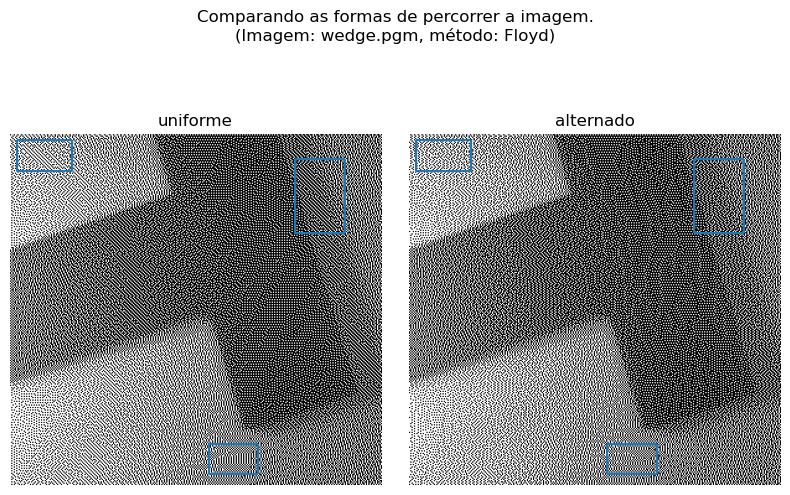

In [12]:
img_id = wedge
img = images[img_id]
img_slice = np.s_[100:400,100:400]
method_id = 0

imgs_to_compare = [half_tone(img[img_slice],error_distribution[method_id],zig_zag=False),
                   half_tone(img[img_slice],error_distribution[method_id],zig_zag=True)]

labels = ['uniforme','alternado']
title = f'Comparando as formas de percorrer a imagem.\n(Imagem: {img_names[img_id]}, método: {method_names[method_id]})'

fig, ax = compare_imgs(imgs_to_compare,
                       labels,
                       title=title,
                       black_pixels_ratio=False);

for n in [0,1]:
    draw_square(ax[n],[5,50],[5,30])
    draw_square(ax[n],[230,270],[20,80])
    draw_square(ax[n],[160,200],[250,275])

Na imagem acima, foram assinaladas àreas onde alguns pixels de mesma cor se 'alinham', podendo gerar alguns efeitos indesejados como a formação de linhas ou a ideia de movimento em alguma direção. Podemos notar que esse efeito indesejado acontece com mais frequência quando percorremos a imagem de maneira uniforme.

Abaixo segue o resultado da aplicação dos métodos na imagem 'baboon'

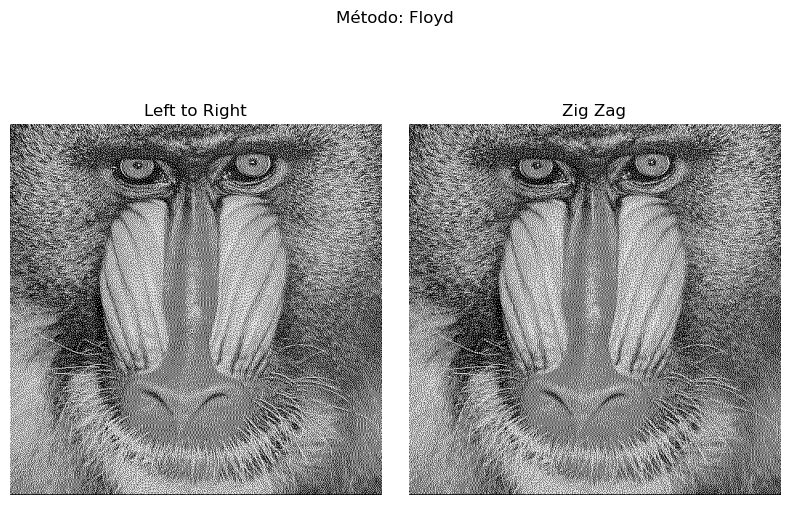

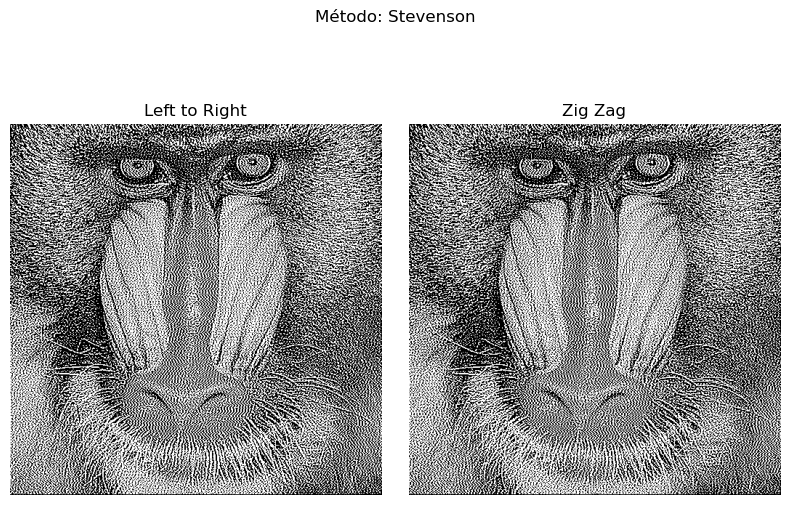

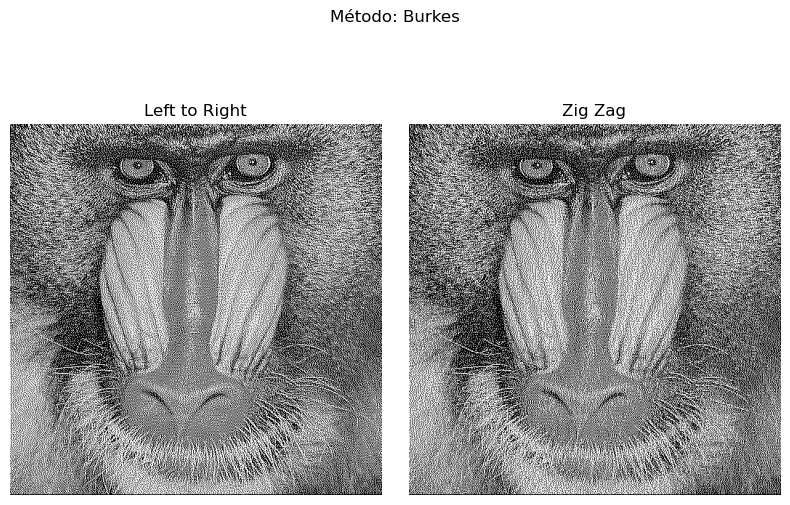

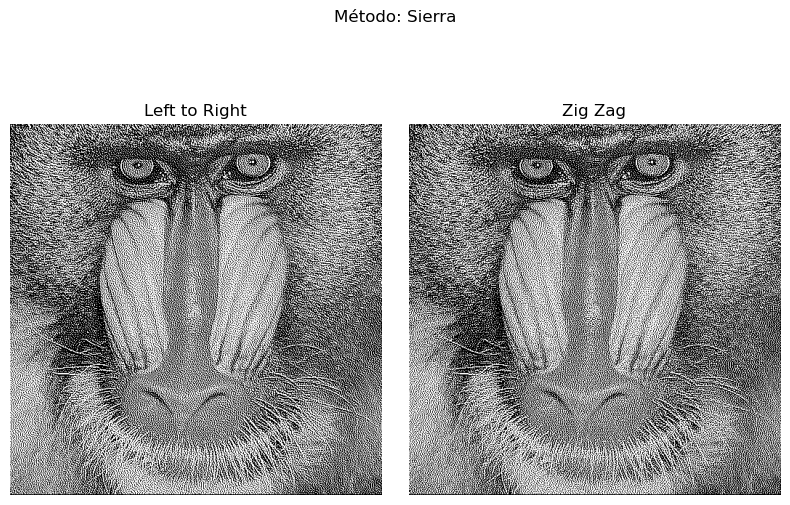

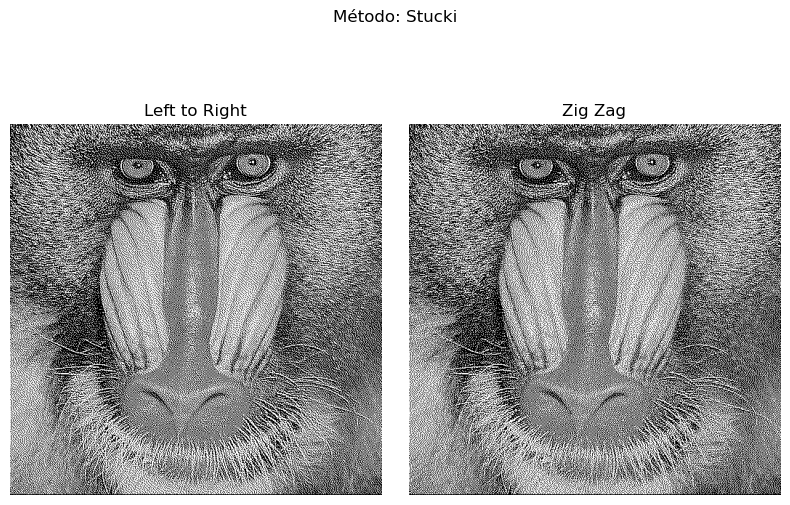

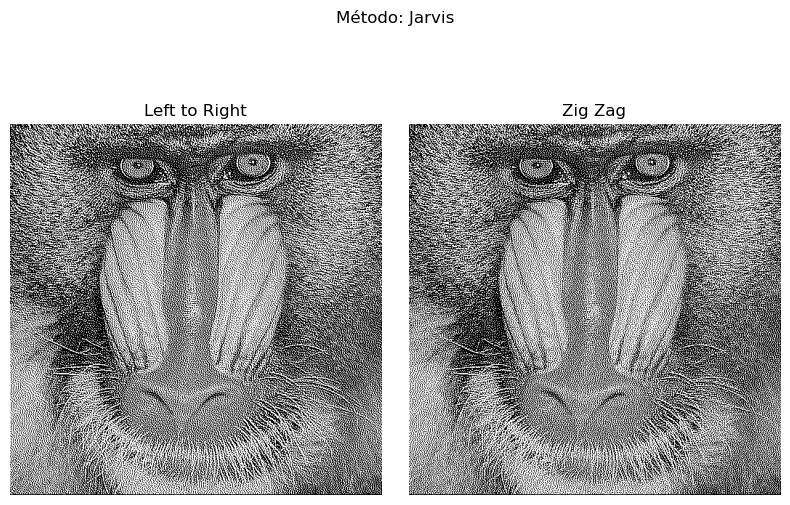

In [13]:
img = images[baboon]

for method_name,E in zip(method_names,error_distribution):
    imgs_to_compare = [half_tone(img,E,zig_zag=False),
                       half_tone(img,E,zig_zag=True)]
    labels = path_strategy
    title = 'Método: '+ method_name

    compare_imgs(imgs_to_compare,
                 labels,
                 title=title,
                 black_pixels_ratio=False);

## Algumas observações sobre os métodos:

### Contraste vs Tons de Cinza

O método de Stevenson dá a impressão de produzir uma imagem com contraste mais acentuado, o que pode ser interessante para alguns tipos de imagens ou técnicas de impressão.
Vale à pena observar que o contraste acentuado é alcançado ao custo de perder o degradê dos tons de cinza e ter um efeito maior de granulação da imagem.
O método de Jarvis fica no meio do caminho, aumenta um pouco o contraste, e perde um pouco das nuances dos tons de cinza da imagem. E possível observar isso prestando atenção às ranhuras do focinho do babuíno nas imagens abaixo.

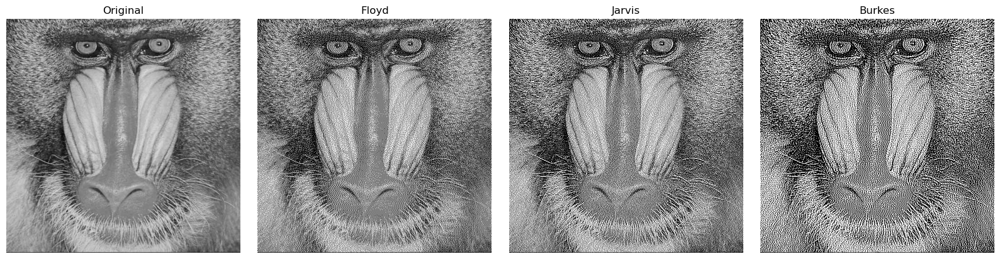

In [14]:
img = images[baboon]

imgs_to_compare = [img,
                   255*half_tone(img,error_distribution[0],zig_zag=True),
                   255*half_tone(img,error_distribution[-1],zig_zag=True),
                   255*half_tone(img,error_distribution[1],zig_zag=True)
                   ]

labels = ['Original']+[method_names[0]]+[method_names[-1]]+[method_names[2]]
title = 'Método:'

compare_imgs(imgs_to_compare,
             labels,
             title='',
             black_pixels_ratio=False);

Abaixo, podemos observar o mesmo efeito em uma imagem colorida, onde o contraste das imagens geradas aumenta da esquerda para a direita (ao custo de perder as nuances)

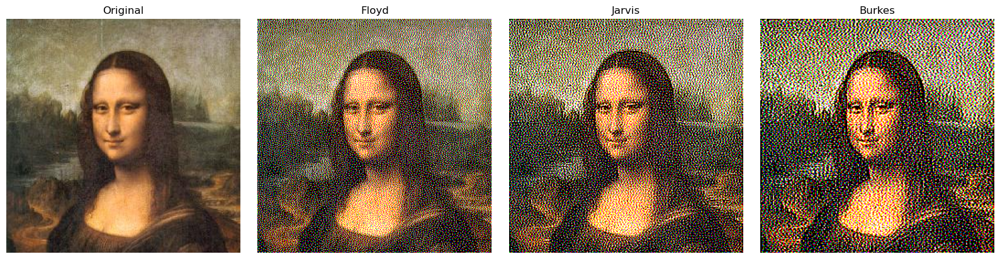

In [15]:
img = color_images[1]

imgs_to_compare = [img,
                   255*half_tone(img,error_distribution[0],zig_zag=True),
                   255*half_tone(img,error_distribution[-1],zig_zag=True),
                   255*half_tone(img,error_distribution[1],zig_zag=True)
                   ]

labels = ['Original']+[method_names[0]]+[method_names[-1]]+[method_names[2]]
title = 'Método:'

compare_imgs(imgs_to_compare,
             labels,
             title='',
             black_pixels_ratio=False);

### A Monalisa

A Monalisa foi composta, propositalmente, de forma a gerar uma dúvida se ela está rindo ou não devido à uma confusão gerada pelo fato dos lábios da modelo parecerem relaxados, mas os músculos faciais apresentarem o tensionamento como se ela estivesse sorrindo. Esse tensionamento é gerado através do sfumato (técnica que consistia em aplicar uma série de camadas de tinta que davam um efeito de esfumaçado).

E é justamente em imagens onde o degradê tem muita relevância que os métodos de meios-tons apresentam uma maior dificuldade.

A seguir, vamos observar o desempenho de cada método na Monalisa

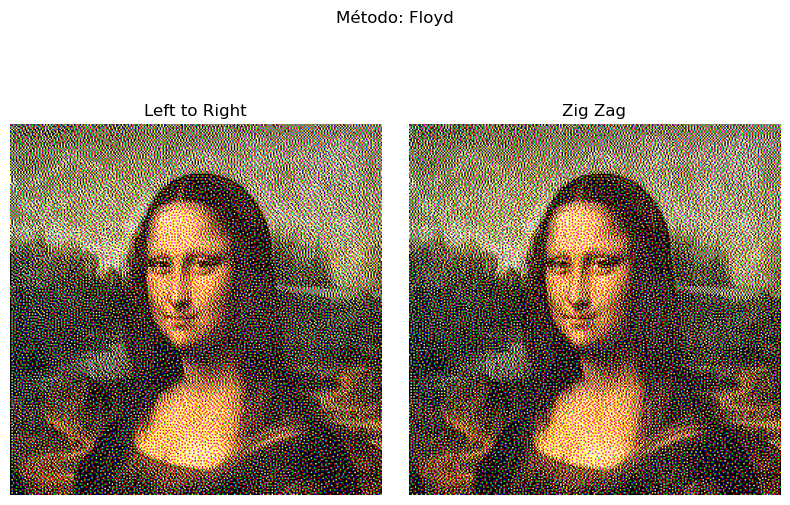

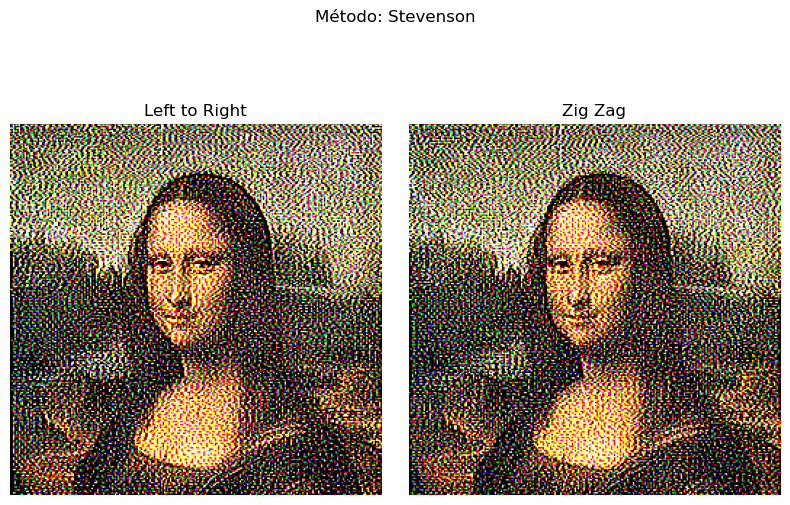

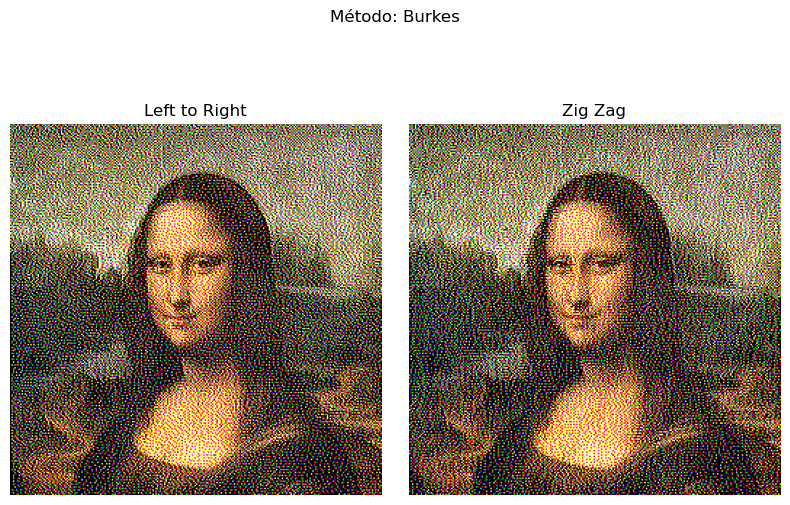

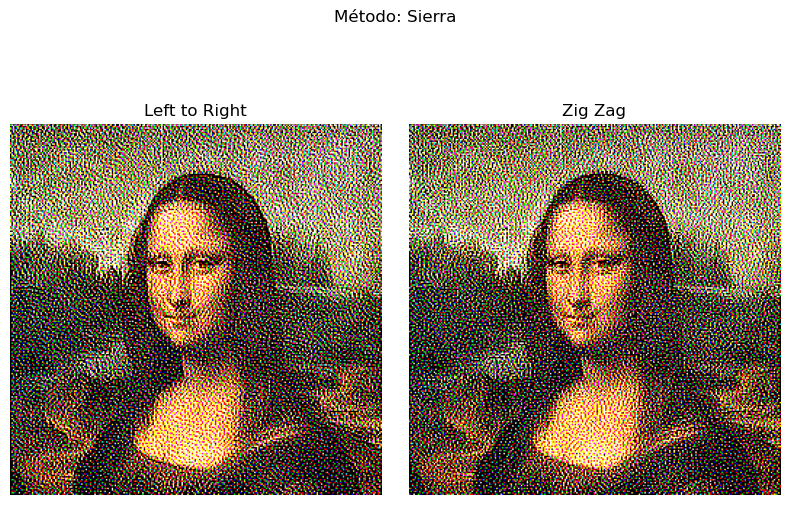

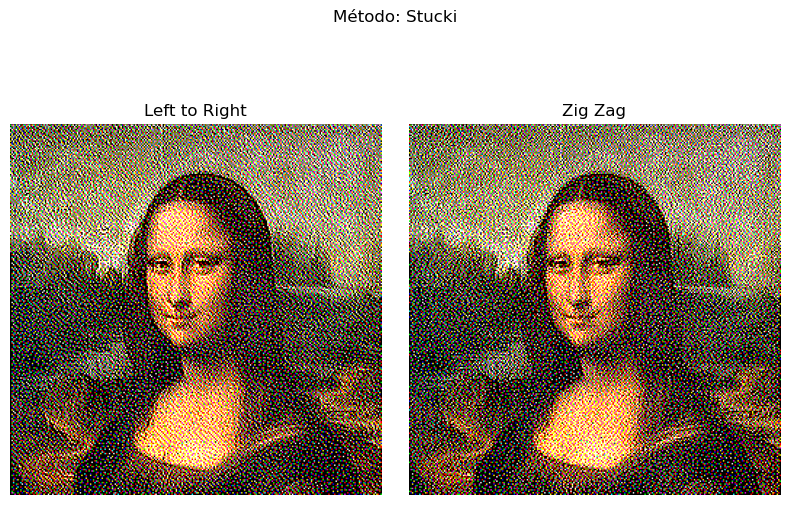

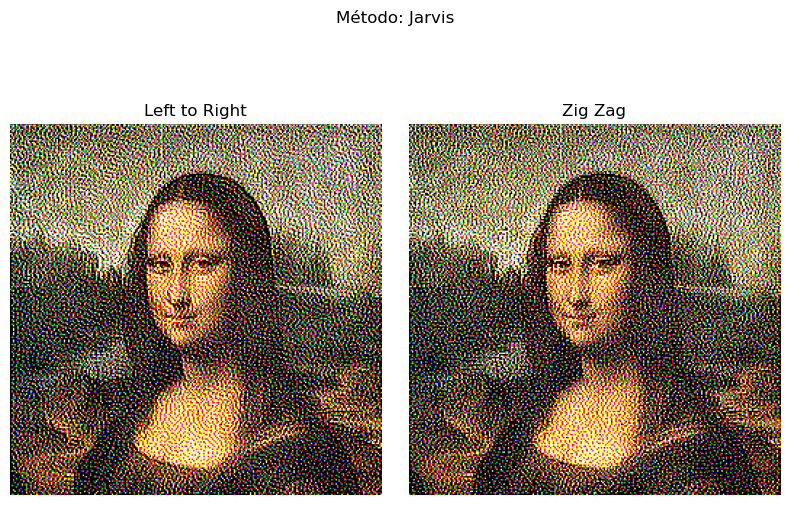

In [16]:
img = color_images[1]

for method_name,E in zip(method_names[0:],error_distribution):
    imgs_to_compare = [img,
                       255*half_tone(img,E,zig_zag=False),
                       255*half_tone(img,E,zig_zag=True)]
    labels = ['original']+path_strategy
    title = 'Método: '+method_name

    compare_imgs(imgs_to_compare[1:],
                 labels[1:],
                 title=title,
                 black_pixels_ratio=False);

#### O sorriso da Monalisa

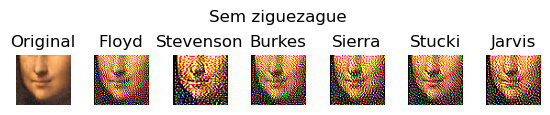

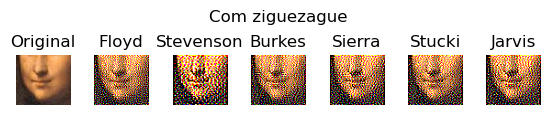

In [17]:
smile = np.s_[105:160,90:150,:]
img = color_images[1][smile]

imgs_to_compare = [255*half_tone(img,E,zig_zag=False) for E in error_distribution]

compare_imgs([img]+imgs_to_compare,
             ['Original']+method_names,
             title='Sem ziguezague',
             im_scale = 0.2,
             black_pixels_ratio=False);

imgs_to_compare = [255*half_tone(img,E,zig_zag=True) for E in error_distribution]

compare_imgs([img]+imgs_to_compare,
             ['Original']+method_names,
             title='Com ziguezague',
             im_scale = 0.2,
             black_pixels_ratio=False);

Acima podemos observar que alguns métodos preservam o sfumato mais do que outros. O método de Burkes com ziguezague até confunde as nuances e parece completar o sorriso que não existe na obra original. O método de Stevenson prioriza o contraste da imagem e perde boa parte do efeito do sfumato (e da ilusão do sorriso), já os outros métodos apresentam resultados mais satisfatórios, cada um com suas peculiaridades (vale ressaltar que estamos analisando os métodos para uma imagem específica, mas todos os métodos tem pontos fortes e fracos para situações específicas)

*As imagens acima foram plotadas em uma escala menor propositalemnte, para observar melhor o efeito resultante de cada método.*

## Conclusão

Ao aplicar um método de meio-tom em uma imagem é preciso ter em mente qual vai ser o uso da imagem final (se for impressão, deve-se considerar as peculiaridades de cada método de impressão, por exemplo). Também é importante entender quais as características da imagem queremos preservar (principalmente a questão do contraste vs nuances).